## 구역별 확진자 수 시각화

- plotly : 파이썬 오픈소스 그래프 라이브러리, mapbox 지도 레이어를 구현할 수 있다. fips code 지원

- mapbox : 맞춤형 디자인 지도를 위한 오픈소스 매핑 플랫폼 

- fips : 구역 코드

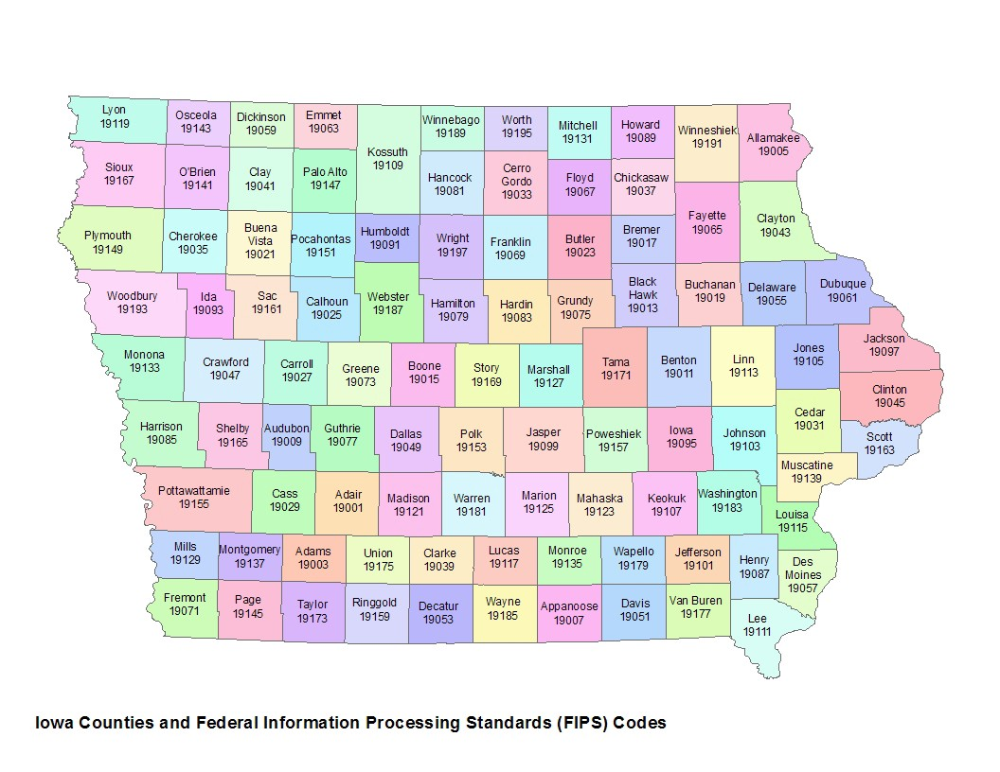

In [2]:
# !pip install plotly
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import warnings
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

warnings.filterwarnings(action = 'ignore')
from urllib.request import urlopen
import json
import pandas as pd
import plotly.express as px
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

covid_cases = pd.read_csv("us_counties_covid19_daily.csv")
covid_cases = covid_cases.groupby('fips').sum()['cases'].reset_index() 

In [3]:
counties

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01001',
    'STATE': '01',
    'COUNTY': '001',
    'NAME': 'Autauga',
    'LSAD': 'County',
    'CENSUSAREA': 594.436},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.496774, 32.344437],
      [-86.717897, 32.402814],
      [-86.814912, 32.340803],
      [-86.890581, 32.502974],
      [-86.917595, 32.664169],
      [-86.71339, 32.661732],
      [-86.714219, 32.705694],
      [-86.413116, 32.707386],
      [-86.411172, 32.409937],
      [-86.496774, 32.344437]]]},
   'id': '01001'},
  {'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01009',
    'STATE': '01',
    'COUNTY': '009',
    'NAME': 'Blount',
    'LSAD': 'County',
    'CENSUSAREA': 644.776},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.577799, 33.765316],
      [-86.759144, 33.840617],
      [-86.953664, 33.815297],
      [-86.954305, 33.844862],
      [-86.96296, 33.844865],
      [-86.9

In [4]:
covid_cases.head()

,fips,cases
0,1001.0,276518
1,1003.0,825734
2,1005.0,140132
3,1007.0,107458
4,1009.0,244029


In [5]:

fig = px.choropleth_mapbox(covid_cases, geojson=counties, locations='fips', color='cases',
                           #geoJSON은 위치정보를 갖는 점을 기반으로 체계적으로 지형을 표현하기 위해 설계된 개방형 공개 표준 형식
                           color_continuous_scale="Viridis", #색상
                           range_color=(0, 276518),# 색상 범위
                           mapbox_style="carto-positron",#맵 스타일 
                           zoom=3.5, center = {"lat": 37.0902, "lon": -95.7129}, # 시작 위치 
                           opacity=0.5, #불투명도
                           labels={'cases':'cases'} # {나타낼 속성 : 지정할 라벨}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#https://plotly.com/python/mapbox-county-choropleth/